In [5]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt


In [12]:
from shapely.geometry import box, Point

In [52]:
p1 = box(0, 0, 1, 1)
p2 = box(1, 0, 11, 10)
p3 = box(15, 0, 25, 10)
p4 = box(0, 15, 1, 16)
p5 = box(0.5, 1, 1, 8)
po1 = Point(8, 5)
circle1 = po1.buffer(10)
po2 = Point(5,5)
circle2 = po2.buffer(5)
circle3 = po2.buffer(10)

In [53]:
gdf = gpd.GeoDataFrame(geometry=[p1, p2, p3, p4, p5])
boundary = gpd.GeoDataFrame(geometry=[circle1,circle2,circle3])

In [54]:
gdf['parameter'] = [1, 2, 3, 4, 5]

In [55]:
gdf

,geometry,parameter
0,"POLYGON ((1 0, 1 1, 0 1, 0 0, 1 0))",1
1,"POLYGON ((11 0, 11 10, 1 10, 1 0, 11 0))",2
2,"POLYGON ((25 0, 25 10, 15 10, 15 0, 25 0))",3
3,"POLYGON ((1 15, 1 16, 0 16, 0 15, 1 15))",4
4,"POLYGON ((1 1, 1 8, 0.5 8, 0.5 1, 1 1))",5


In [60]:
gdf.area

0      1.0
1    100.0
2    100.0
3      1.0
4      3.5
dtype: float64

In [59]:
gdf.area*gdf.parameter

0      1.0
1    200.0
2    300.0
3      4.0
4     17.5
dtype: float64

In [61]:
(1+200+17.5)/(1+100+3.5)

2.090909090909091

In [56]:
boundary.explore()

<Axes: >

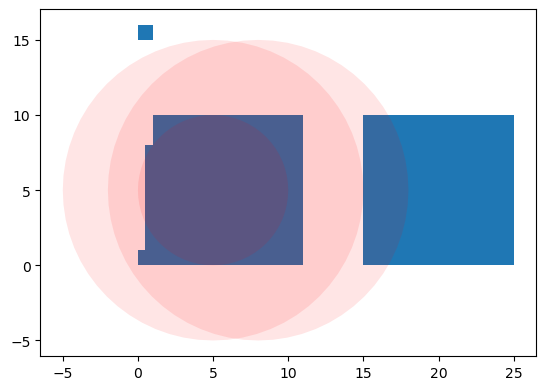

In [57]:
ax = gdf.plot()
boundary.plot(ax=ax, color='red',alpha=0.1)

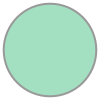

In [49]:
boundary['geometry'].loc[0]

<Axes: >

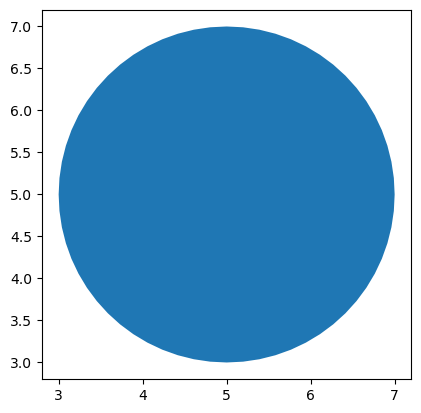

In [19]:
boundary.plot()

In [62]:
def spatially_averaged_params(boundaries, buildings, param):
    """This function defines the function to be fit. In this case a linear function.
    
    Parameters
    ----------
    boundaries : geodataframe containing geometries of the areas of interest
    buildings : geodataframe of buildings
    param : string of the parameter to be spatially averaged
    
    Returns
    -------
    gdf : geodataframe of boundaries and spatially averaged parameters
    """
    
    gdf = boundaries.copy()

    bldgs_trimmed = boundaries.overlay(buildings, how="intersection")

    contains_a, contains_b = boundaries.sindex.query(bldgs_trimmed['geometry'], predicate="within")

    for index, s in boundaries.iterrows():

        bldgs_subselect = bldgs_trimmed.loc[contains_a[contains_b==index]]

        # area of buildings
        bldgs_area = bldgs_subselect['geometry'].area
        bldgs_area_sum = bldgs_area.sum()

        # plan area weighted parameter average
        bldgs_param = (bldgs_subselect[param] * bldgs_area).sum() / bldgs_area_sum
        
        gdf.loc[index, param] = bldgs_param

    return gdf

In [63]:
spatially_averaged_params(boundary,gdf,'parameter')

/Users/lisawinkler/opt/anaconda3/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:2457: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(
/var/folders/x_/j9q17vrn0kbcj5x0_xh931480000gn/T/ipykernel_19714/496802924.py:30: RuntimeWarning: invalid value encountered in scalar divide
  bldgs_param = (bldgs_subselect[param] * bldgs_area).sum() / bldgs_area_sum


,geometry,parameter
0,"POLYGON ((18 5, 17.95185 4.01983, 17.80785 3.0...",2.093841
1,"POLYGON ((10 5, 9.97592 4.50991, 9.90393 4.024...",NaN
2,"POLYGON ((15 5, 14.95185 4.01983, 14.80785 3.0...",2.093841


In [72]:
overlaps = boundary.overlay(gdf, how="intersection")

/Users/lisawinkler/opt/anaconda3/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:2457: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(


In [73]:
overlaps

,parameter,geometry
0,1,"POLYGON ((0 0, 0 1, 1 1, 1 0, 0 0))"
1,2,"POLYGON ((1 0, 1 10, 11 10, 11 0, 1 0))"
2,3,"POLYGON ((17.95185 4.01983, 17.80785 3.0491, 1..."
3,5,"POLYGON ((0.5 1, 0.5 8, 1 8, 1 1, 0.5 1))"
4,2,"POLYGON ((9.97592 4.50991, 9.90393 4.02455, 9...."
5,5,"POLYGON ((0.84265 2.22215, 0.59039 2.64302, 0...."
6,1,"POLYGON ((0 0, 0 1, 1 1, 1 0, 0 0))"
7,2,"POLYGON ((1 0, 1 10, 11 10, 11 0, 1 0))"
8,5,"POLYGON ((0.5 1, 0.5 8, 1 8, 1 1, 0.5 1))"


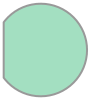

In [79]:
overlaps.loc[4].geometry

/Users/lisawinkler/opt/anaconda3/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:2457: UserWarning: `keep_geom_type=True` in overlay resulted in 1 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(


<Axes: >

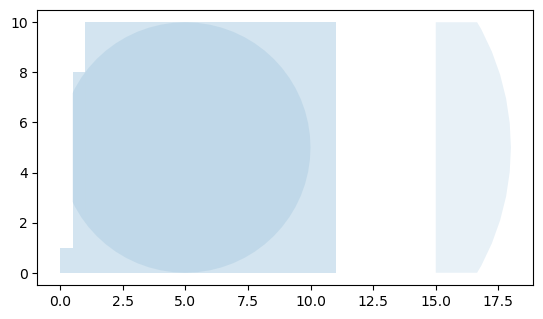

In [71]:
boundary.overlay(gdf, how="intersection").plot(alpha=0.1)

In [66]:
contains_a, contains_b = boundary.sindex.query(gdf['geometry'], predicate="within")

In [80]:
contains_a

array([0, 0, 1, 1, 4, 4])

In [69]:
contains_b

array([2, 0, 2, 0, 2, 0])

In [82]:
import geopandas

In [83]:
import geodatasets

chicago = geopandas.read_file(geodatasets.get_path("geoda.chicago_commpop"))

groceries = geopandas.read_file(geodatasets.get_path("geoda.groceries"))


chicago = chicago.to_crs("ESRI:102003")

groceries = groceries.to_crs("ESRI:102003")

Extracting 'chicago_commpop/chicago_commpop.geojson' from '/Users/lisawinkler/Library/Caches/geodatasets/chicago_commpop.zip' to '/Users/lisawinkler/Library/Caches/geodatasets/chicago_commpop.zip.unzip'
Extracting 'grocery/chicago_sup.shp' from '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip' to '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip.unzip'
Extracting 'grocery/chicago_sup.dbf' from '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip' to '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip.unzip'
Extracting 'grocery/chicago_sup.shx' from '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip' to '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip.unzip'
Extracting 'grocery/chicago_sup.prj' from '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip' to '/Users/lisawinkler/Library/Caches/geodatasets/grocery.zip.unzip'


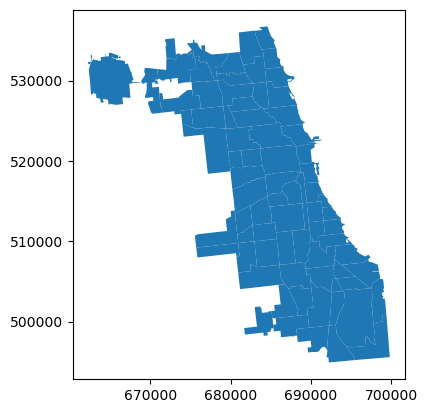

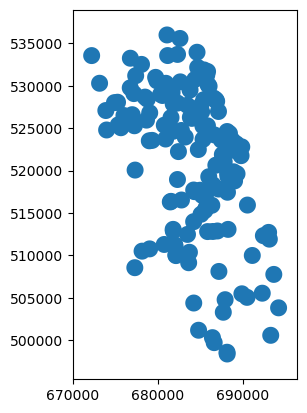

In [84]:

chicago.plot();



groceries.crs

















groceries['geometry']= groceries.buffer(1000)

groceries.plot();

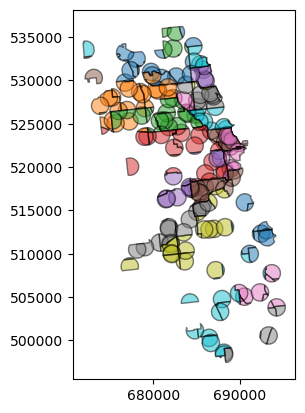

In [85]:
chicago_cores = chicago.overlay(groceries, how='intersection')

chicago_cores.plot(alpha=0.5, edgecolor='k', cmap='tab10');

In [106]:
stns = gpd.read_parquet('fbg_stations.parquet')
bldgs = gpd.read_parquet('buildings_detailed.parquet')
stns = stns.to_crs(bldgs.crs)

<Axes: >

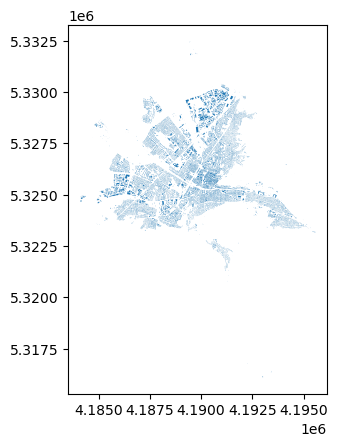

In [107]:
bldgs.plot()

In [108]:
stns['geometry']= stns.buffer(300)

<Axes: >

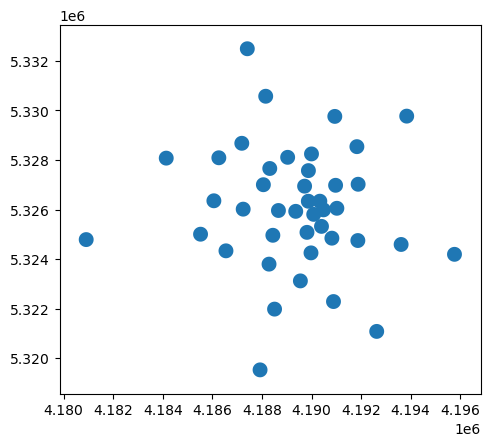

In [109]:
stns.plot()

In [112]:
ovy

,oid,aktualit,gebnutzbez,funktion,fktkurz,name_x,anzahlgs,lagebeztxt,geometry_x,geometry_y,...,class,name_y,ID,Type,Elevation (m a.s.l),UAC,LCZ,Longitude (°E),Latitude (°N),geometry
0,DEBWL0010007TA00BL,2012-11-14,Gebaeude,Wohnhaus,31001_1010,None,NaN,Schwaighofstraße 6,"POLYGON ((4190103.272 5324356.745, 4190103.325...",MULTIPOLYGON Z (((413956.642 5314962.283 275.2...,...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190103.325 5324356.864, 4190103.385..."
1,DEBWL0010007TA01BL,2019-12-06,Gebaeude,Umformer,31001_2523,None,NaN,Beethovenstraße 1 x,"POLYGON ((4189859.791 5324420.906, 4189860.299...",MULTIPOLYGON Z (((413711.51 5315020.19 274.964...,...,Sonstige,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4189860.299 5324424.424, 4189866.1 5..."
2,DEBWL0010007TA02BL,2014-05-05,Gebaeude,Wohnhaus,31001_1010,None,NaN,Silberbachstraße 12,"POLYGON ((4190015.838 5324303.786, 4190032.423...",MULTIPOLYGON Z (((413887.99 5314905.18 277.091...,...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190032.423 5324302.448, 4190032.421..."
3,DEBWL0010007TA05BL,2012-11-14,Gebaeude,Wohnhaus,31001_1010,None,NaN,Schwaighofstraße 18,"POLYGON ((4189995.904 5324408.767, 4189995.223...","MULTIPOLYGON Z (((413846.8 5315008.27 274.575,...",...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4189995.223 5324407.22, 4189999.666 ..."
4,DEBWL0010007TA06BL,2012-11-14,Gebaeude,Garage,31001_2463,None,NaN,None,"POLYGON ((4189978.916 5324414.41, 4189982.037 ...","MULTIPOLYGON Z (((413833.42 5315013.5 274.425,...",...,Sonstige,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4189982.037 5324412.976, 4189979.01 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9718,DEBWL0010007TySfBL,2024-03-15,Gebaeude,Wohnhaus,31001_1010,None,NaN,"Uferstraße 69, 67","POLYGON ((4188747.852 5325877.884, 4188768.898...",MULTIPOLYGON Z (((412542.67 5316428.55 257.402...,...,Wohnen,None,FRDREI,T1,260,12220,6,7.826545,47.995872,"POLYGON ((4188768.898 5325864.235, 4188771.167..."
9719,DEBWL0010007TwDBBL,2024-04-05,Gebaeude,Wohn- und Geschäftsgebäude,31001_1123,None,NaN,Basler Straße 24 b,"POLYGON ((4190001.71 5324974.214, 4190010.805 ...",MULTIPOLYGON Z (((413840.29 5315574.96 271.672...,...,Sonstige,None,FRUWIE,T2,272,11220,5,7.842559,47.988523,"POLYGON ((4190010.805 5324974.581, 4190011.195..."
9720,DEBWL0010007TwDDBL,2024-04-05,Gebaeude,Gebäude für Vorratshaltung,31001_2140,None,NaN,None,"POLYGON ((4190001.26 5324985.036, 4190001.036 ...",MULTIPOLYGON Z (((413829.92 5315590.56 271.851...,...,Sonstige,None,FRUWIE,T2,272,11220,5,7.842559,47.988523,"POLYGON ((4190001.036 5324990.597, 4190005.689..."
9721,DEBWL0010007TwDEBL,2024-04-05,Gebaeude,Wohnhaus,31001_1010,None,NaN,Basler Straße 24,"POLYGON ((4190003.635 5325003.284, 4190019.171...",MULTIPOLYGON Z (((413832.02 5315603.32 271.487...,...,Wohnen,None,FRUWIE,T2,272,11220,5,7.842559,47.988523,"POLYGON ((4190019.171 5325005.896, 4190021.209..."


In [114]:
ovy.explore(column = 'ID', alpha=0.5, cmap='tab10')

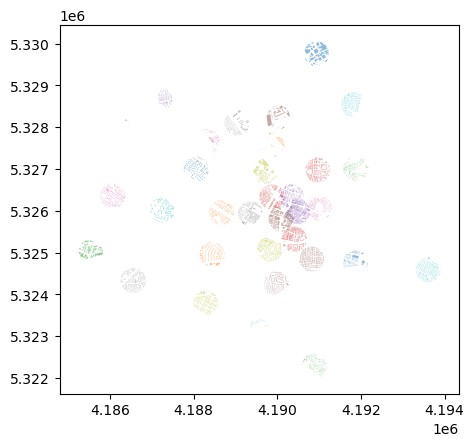

In [113]:
ovy = bldgs.overlay(stns, how='intersection')

ovy.plot(column = 'ID', alpha=0.5, edgecolor=None, cmap='tab10');

In [105]:
ovy

,oid,aktualit,gebnutzbez,funktion,fktkurz,name_x,anzahlgs,lagebeztxt,geometry_x,geometry_y,...,class,name_y,ID,Type,Elevation (m a.s.l),UAC,LCZ,Longitude (°E),Latitude (°N),geometry
0,DEBWL0010007TA02BL,2014-05-05,Gebaeude,Wohnhaus,31001_1010,None,NaN,Silberbachstraße 12,"POLYGON ((4190015.838 5324303.786, 4190032.423...",MULTIPOLYGON Z (((413887.99 5314905.18 277.091...,...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190032.423 5324302.448, 4190032.421..."
1,DEBWL0010007TA0CBL,2018-12-20,Gebaeude,Wohnhaus,31001_1010,None,NaN,Silberbachstraße 10,"POLYGON ((4190061.641 5324294.534, 4190061.186...","MULTIPOLYGON Z (((413917.23 5314892.41 276.22,...",...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190061.186 5324288.528, 4190060.677..."
2,DEBWL0010007TA0DBL,2018-12-20,Gebaeude,Garage,31001_2463,None,NaN,None,"POLYGON ((4190062.122 5324301.732, 4190066.233...","MULTIPOLYGON Z (((413921.76 5314905.58 276.91,...",...,Sonstige,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190064.71 5324301.606, 4190065.964 ..."
3,DEBWL0010007TA0TBL,2012-11-14,Gebaeude,Wohnhaus,31001_1010,None,NaN,Silberbachstraße 7,"POLYGON ((4190081.108 5324231.345, 4190078.825...","MULTIPOLYGON Z (((413937.05 5314836.1 279.669,...",...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190075.142 5324230.515, 4190070.41 ..."
4,DEBWL0010007TA0UBL,2012-11-14,Gebaeude,Wohnhaus,31001_1010,None,NaN,Silberbachstraße 11,"POLYGON ((4190038.543 5324250.663, 4190037.234...",MULTIPOLYGON Z (((413895.41 5314838.13 279.332...,...,Wohnen,None,FRLORE,T2,281,11210,6,7.845321,47.981176,"POLYGON ((4190037.234 5324235.059, 4190036.032..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,DEBWL0010007TyS7BL,2024-03-15,Gebaeude,Wohnhaus,31001_1010,None,NaN,Haslacher Straße 103,"POLYGON ((4188650.788 5325867.725, 4188655.885...",MULTIPOLYGON Z (((412443.87 5316403.62 257.551...,...,Wohnen,None,FRDREI,T1,260,12220,6,7.826545,47.995872,"POLYGON ((4188655.885 5325865.021, 4188655.831..."
1274,DEBWL0010007TyS8BL,2024-03-15,Gebaeude,Wohnhaus,31001_1010,None,NaN,Bohlstraße 2,"POLYGON ((4188651.108 5325889.802, 4188660.259...",MULTIPOLYGON Z (((412457.28 5316430.35 257.508...,...,Wohnen,None,FRDREI,T1,260,12220,6,7.826545,47.995872,"POLYGON ((4188660.259 5325884.675, 4188658.255..."
1275,DEBWL0010007TyS9BL,2024-03-15,Gebaeude,Wohnhaus,31001_1010,None,NaN,Bohlstraße 4,"POLYGON ((4188651.108 5325889.802, 4188657.722...","MULTIPOLYGON Z (((412454.21 5316447.38 257.01,...",...,Wohnen,None,FRDREI,T1,260,12220,6,7.826545,47.995872,"POLYGON ((4188657.722 5325901.612, 4188666.854..."
1276,DEBWL0010007TySdBL,2024-03-15,Gebaeude,Garage,31001_2463,None,NaN,None,"POLYGON ((4188670.675 5325870.869, 4188690.826...","MULTIPOLYGON Z (((412488.76 5316407.1 256.495,...",...,Sonstige,None,FRDREI,T1,260,12220,6,7.826545,47.995872,"POLYGON ((4188684.285 5325863.657, 4188674.861..."


In [ ]:
# create a DataFrame to store the average building height within each radius of each station
height = pd.DataFrame(index=radii, columns=stns.ID)
weighted_height = pd.DataFrame(index=radii, columns=stns.ID)
car = pd.DataFrame(index=radii, columns=stns.ID)

for r in tqdm(radii):

    bldgs_trimmed = stns['r'+str(r)].to_frame().overlay(bldgs, how="intersection")

    # check which buildings are within 100m of a station
    # output is a tuple of two arrays, the first contains the indices of the buildings that are within 100m of a station, 
    # the second contains the indices of the stations that have buildings within 100m
    contains_a, contains_b = stns['r'+str(r)].sindex.query(bldgs_trimmed['geometry'], predicate="within")

    for index, s in stns.iterrows():

        bldgs_subselect = bldgs_trimmed.loc[contains_a[contains_b==index]]

        # area of buildings
        bldgs_area = bldgs_subselect['geometry'].area
        bldgs_area_sum = bldgs_area.sum()

        # plan averaged height per building
        avg_height = bldgs_subselect['measuredHeight'] * bldgs_area

        weighted_height.loc[r, s.ID] = avg_height.sum()/bldgs_area_sum 
        
        circle_area = s['r'+str(r)].area
        
        # covered area ratio
        car.loc[r, s.ID] = bldgs_area_sum/circle_area

        # check which buildings are within radius r of station with index index
        hght = bldgs_subselect.measuredHeight.mean()
        
        # store the average building height within radius r of station ID
        height.loc[r, s.ID] = hght

        # loop through each building and multiply height by area
        # then sum all the values and divide by the area of the circle
        # to get the average height of buildings within the circle
        
        #weighted_height.loc[r, s.ID] = bldgs_trimmed.loc[contains_a[contains_b==index]].measuredHeight.multiply(bldgs_trimmed.loc[contains_a[contains_b==index]].area).sum()/bldgs_area
